# EDA

The key stats that score points in FPL (Fantasy Premier League) are goals, clean sheets, and assists. This notebook aims to investigate how these stats are related to other attributes, such as team and opposition team strength, Home/Away games, minutes played, shots and key passses, and FPL ICT indexes.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [2]:
player_df=pd.read_csv('player_gw_clean/player_gw_clean_all.csv')

In [3]:
fixture_df=pd.read_csv('fixture_gw_clean/fixture_gw_clean_all.csv')

In [4]:
team_df=pd.read_csv('data_clean/teams_clean.csv')

In [5]:
elements_df=pd.read_csv('data_clean/elements_clean.csv')

In [6]:
per90_df=pd.read_csv('scrape_players_id/playerinfo_id_week_all.csv')

## Creating EDA Dataframe

To create a dataframe for EDA we merge data from various csv files.

In [7]:
eda_df=player_df[['id','fixture_id','stats.goals_scored','stats.assists','stats.clean_sheets','gw','stats.minutes','stats.influence','stats.creativity','stats.threat','stats.ict_index']].copy()

In [8]:
eda_df.head()

,id,fixture_id,stats.goals_scored,stats.assists,stats.clean_sheets,gw,stats.minutes,stats.influence,stats.creativity,stats.threat,stats.ict_index
0,14,10,0,0,1,1,90,18.0,0.0,0.0,1.8
1,27,6,0,0,0,1,0,0.0,0.0,0.0,0.0
2,47,7,0,0,1,1,90,25.4,0.0,0.0,2.5
3,48,7,0,0,0,1,0,0.0,0.0,0.0,0.0
4,72,2,0,0,0,1,0,0.0,0.0,0.0,0.0


now we add players team id's to this dataframe

In [9]:
temp_df=elements_df[['id','team']].copy()

In [10]:
eda_df = pd.merge(eda_df,temp_df,on="id",how='outer')

In [11]:
eda_df.head()

,id,fixture_id,stats.goals_scored,stats.assists,stats.clean_sheets,gw,stats.minutes,stats.influence,stats.creativity,stats.threat,stats.ict_index,team
0,14,10,0,0,1,1,90,18.0,0.0,0.0,1.8,1
1,14,11,0,0,0,2,90,26.4,0.0,0.0,2.6,1
2,14,24,0,0,0,3,90,19.0,0.0,0.0,1.9,1
3,14,31,0,0,0,4,90,29.6,0.0,0.0,3.0,1
4,14,49,0,0,0,5,90,45.4,0.0,0.0,4.5,1


now we add players opposition team for each game to dataframe

In [12]:
temp2_df=fixture_df[['id','team_a','team_h']].copy()

In [13]:
temp2_df.rename(columns={"id":"fixture_id"},inplace=True)

In [14]:
temp2_df.head()

,fixture_id,team_a,team_h
0,1,14,10
1,8,11,19
2,2,15,3
3,3,16,5
4,4,8,7


In [15]:
eda_df=pd.merge(eda_df,temp2_df,left_on=["fixture_id","team"],right_on=["fixture_id","team_a"],how='outer')

In [16]:
eda_df.head()

,id,fixture_id,stats.goals_scored,stats.assists,stats.clean_sheets,gw,stats.minutes,stats.influence,stats.creativity,stats.threat,stats.ict_index,team,team_a,team_h
0,14.0,10,0.0,0.0,1.0,1.0,90.0,18.0,0.0,0.0,1.8,1.0,1.0,13.0
1,427.0,10,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,13.0
2,1.0,10,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,13.0
3,2.0,10,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,13.0
4,3.0,10,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,13.0


this has added data for when the player is away

In [17]:
eda_df=pd.merge(eda_df,temp2_df,left_on=["fixture_id","team"],right_on=["fixture_id","team_h"],how='outer')

now data for when the player is home is added

In [18]:
eda_df['opp'] = eda_df["team_h_x"].fillna(0) + eda_df["team_a_y"].fillna(0)

the above codeblock creates a single feature for the players opposition team

In [19]:
eda_df.head()

,id,fixture_id,stats.goals_scored,stats.assists,stats.clean_sheets,gw,stats.minutes,stats.influence,stats.creativity,stats.threat,stats.ict_index,team,team_a_x,team_h_x,team_a_y,team_h_y,opp
0,14.0,10,0.0,0.0,1.0,1.0,90.0,18.0,0.0,0.0,1.8,1.0,1.0,13.0,NaN,NaN,13.0
1,427.0,10,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,13.0,NaN,NaN,13.0
2,1.0,10,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,13.0,NaN,NaN,13.0
3,2.0,10,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,13.0,NaN,NaN,13.0
4,3.0,10,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,13.0,NaN,NaN,13.0


In [20]:
eda_df["home"]=np.where(eda_df["team_h_x"].isna(),True,False)

this adds a feature for whether the player is home or away

In [21]:
eda_df.drop(['team_a_x', 'team_h_x', 'team_a_y',
       'team_h_y',], axis=1,inplace=True)

now irrelevent columns dropped

In [22]:
eda_df.head()

,id,fixture_id,stats.goals_scored,stats.assists,stats.clean_sheets,gw,stats.minutes,stats.influence,stats.creativity,stats.threat,stats.ict_index,team,opp,home
0,14.0,10,0.0,0.0,1.0,1.0,90.0,18.0,0.0,0.0,1.8,1.0,13.0,False
1,427.0,10,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,13.0,False
2,1.0,10,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,13.0,False
3,2.0,10,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,13.0,False
4,3.0,10,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,13.0,False


now we add the strength ratings (attack and defence) of players teams and their opposition

In [23]:
temp3_df=team_df[['id','strength_attack_home','strength_attack_away','strength_defence_home','strength_defence_away']].copy()


In [24]:
temp3_df.rename(columns={'id':'opp'},inplace=True)

In [25]:
temp3_df.head()

,opp,strength_attack_home,strength_attack_away,strength_defence_home,strength_defence_away
0,1,1150,1190,1280,1330
1,2,1030,1060,1030,1050
2,3,1030,1070,1110,1180
3,4,1040,1160,1030,1130
4,5,1060,1130,1050,1050


In [26]:
eda_df=pd.merge(eda_df,temp3_df,on="opp",how='outer')

In [27]:
eda_df.rename(columns={'strength_attack_home':'opp_att_h', 'strength_attack_away':'opp_att_a', 'strength_defence_home': 'opp_def_h', 'strength_defence_away':'opp_def_a'},inplace=True)

In [28]:
eda_df.head()

,id,fixture_id,stats.goals_scored,stats.assists,stats.clean_sheets,gw,stats.minutes,stats.influence,stats.creativity,stats.threat,stats.ict_index,team,opp,home,opp_att_h,opp_att_a,opp_def_h,opp_def_a
0,14.0,10,0.0,0.0,1.0,1.0,90.0,18.0,0.0,0.0,1.8,1.0,13.0,False,1040.0,1090.0,1020.0,1030.0
1,427.0,10,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,13.0,False,1040.0,1090.0,1020.0,1030.0
2,1.0,10,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,13.0,False,1040.0,1090.0,1020.0,1030.0
3,2.0,10,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,13.0,False,1040.0,1090.0,1020.0,1030.0
4,3.0,10,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,13.0,False,1040.0,1090.0,1020.0,1030.0


opposition teams ratings have been added, now to add players own team ratings

In [29]:
temp3_df.rename(columns={'opp':'team'},inplace=True)

In [30]:
eda_df=pd.merge(eda_df,temp3_df,on="team",how='outer')

In [31]:
eda_df.rename(columns={'strength_attack_home':'att_h', 'strength_attack_away':'att_a', 'strength_defence_home': 'def_h', 'strength_defence_away':'def_a'},inplace=True)

In [32]:
eda_df.head()

,id,fixture_id,stats.goals_scored,stats.assists,stats.clean_sheets,gw,stats.minutes,stats.influence,stats.creativity,stats.threat,...,opp,home,opp_att_h,opp_att_a,opp_def_h,opp_def_a,att_h,att_a,def_h,def_a
0,14.0,10,0.0,0.0,1.0,1.0,90.0,18.0,0.0,0.0,...,13.0,False,1040.0,1090.0,1020.0,1030.0,1150.0,1190.0,1280.0,1330.0
1,427.0,10,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,13.0,False,1040.0,1090.0,1020.0,1030.0,1150.0,1190.0,1280.0,1330.0
2,1.0,10,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,13.0,False,1040.0,1090.0,1020.0,1030.0,1150.0,1190.0,1280.0,1330.0
3,2.0,10,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,13.0,False,1040.0,1090.0,1020.0,1030.0,1150.0,1190.0,1280.0,1330.0
4,3.0,10,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,13.0,False,1040.0,1090.0,1020.0,1030.0,1150.0,1190.0,1280.0,1330.0


create features for attack and defence ratings for own team and opposition dependent on which team is away and which is home

In [33]:
eda_df["opp_att"]=np.where(eda_df["home"],eda_df["opp_att_a"],eda_df["opp_att_h"])

In [34]:
eda_df["opp_def"]=np.where(eda_df["home"],eda_df["opp_def_a"],eda_df["opp_def_h"])

In [35]:
eda_df["att"]=np.where(eda_df["home"],eda_df["att_h"],eda_df["att_a"])

In [36]:
eda_df["def"]=np.where(eda_df["home"],eda_df["def_h"],eda_df["def_a"])

In [37]:
eda_df.head()

,id,fixture_id,stats.goals_scored,stats.assists,stats.clean_sheets,gw,stats.minutes,stats.influence,stats.creativity,stats.threat,...,opp_def_h,opp_def_a,att_h,att_a,def_h,def_a,opp_att,opp_def,att,def
0,14.0,10,0.0,0.0,1.0,1.0,90.0,18.0,0.0,0.0,...,1020.0,1030.0,1150.0,1190.0,1280.0,1330.0,1040.0,1020.0,1190.0,1330.0
1,427.0,10,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,1020.0,1030.0,1150.0,1190.0,1280.0,1330.0,1040.0,1020.0,1190.0,1330.0
2,1.0,10,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,1020.0,1030.0,1150.0,1190.0,1280.0,1330.0,1040.0,1020.0,1190.0,1330.0
3,2.0,10,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,1020.0,1030.0,1150.0,1190.0,1280.0,1330.0,1040.0,1020.0,1190.0,1330.0
4,3.0,10,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,1020.0,1030.0,1150.0,1190.0,1280.0,1330.0,1040.0,1020.0,1190.0,1330.0


In [38]:
eda_df.rename(columns={'stats.goals_scored':'G', 'stats.assists':'A','stats.clean_sheets':'CS','stats.minutes':'MP','stats.influence':'I','stats.creativity':'C','stats.threat':'T','stats.ict_index':'ICT'},inplace=True)

features renamed for simplicity

In [39]:
eda_df.head()

,id,fixture_id,G,A,CS,gw,MP,I,C,T,...,opp_def_h,opp_def_a,att_h,att_a,def_h,def_a,opp_att,opp_def,att,def
0,14.0,10,0.0,0.0,1.0,1.0,90.0,18.0,0.0,0.0,...,1020.0,1030.0,1150.0,1190.0,1280.0,1330.0,1040.0,1020.0,1190.0,1330.0
1,427.0,10,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,1020.0,1030.0,1150.0,1190.0,1280.0,1330.0,1040.0,1020.0,1190.0,1330.0
2,1.0,10,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,1020.0,1030.0,1150.0,1190.0,1280.0,1330.0,1040.0,1020.0,1190.0,1330.0
3,2.0,10,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,1020.0,1030.0,1150.0,1190.0,1280.0,1330.0,1040.0,1020.0,1190.0,1330.0
4,3.0,10,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,1020.0,1030.0,1150.0,1190.0,1280.0,1330.0,1040.0,1020.0,1190.0,1330.0


In [40]:
eda_df.shape

(15302, 26)

In [41]:
eda_df.isna().sum()

id              2
fixture_id      0
G               2
A               2
CS              2
gw              2
MP              2
I               2
C               2
T               2
ICT             2
team            2
opp             0
home            0
opp_att_h     129
opp_att_a     129
opp_def_h     129
opp_def_a     129
att_h           2
att_a           2
def_h           2
def_a           2
opp_att       129
opp_def       129
att             2
def             2
dtype: int64

It appears there are 2 entries with most features missing, and 129 entries with opponents rating missing, this is likely due to a few syntax issues with some read in data. These points can be removed as they correspond to about 5 games of data, whilst we still will have over 15000 entries, which should be enough for EDA and machine learning processes.

In [42]:
eda_df.dropna(inplace=True)

In [43]:
eda_df.columns

Index(['id', 'fixture_id', 'G', 'A', 'CS', 'gw', 'MP', 'I', 'C', 'T', 'ICT',
       'team', 'opp', 'home', 'opp_att_h', 'opp_att_a', 'opp_def_h',
       'opp_def_a', 'att_h', 'att_a', 'def_h', 'def_a', 'opp_att', 'opp_def',
       'att', 'def'],
      dtype='object')

### Introduce scraped data

now to merge data scraped from overstat.com, we create a new dataframe for version control reasons. This is helpful in the case that analysis is wanted on a larger dataset without the scraped features.

In [44]:
temp4_df=per90_df[['id','gw','Sh90','KP90']].copy()

In [45]:
temp4_df.head()

,id,gw,Sh90,KP90
0,4.0,1,0.0,1.0
1,5.0,1,0.0,0.0
2,6.0,1,0.0,1.0
3,11.0,1,4.0,0.0
4,14.0,1,0.0,0.0


In [46]:
temp4_df.shape

(7013, 4)

In [47]:
eda2_df=pd.merge(eda_df,temp4_df,on=['id','gw'],how='inner')

In [48]:
eda2_df.head()

,id,fixture_id,G,A,CS,gw,MP,I,C,T,...,att_h,att_a,def_h,def_a,opp_att,opp_def,att,def,Sh90,KP90
0,14.0,10,0.0,0.0,1.0,1.0,90.0,18.0,0.0,0.0,...,1150.0,1190.0,1280.0,1330.0,1040.0,1020.0,1190.0,1330.0,0.0,0.0
1,4.0,10,0.0,1.0,1.0,1.0,90.0,38.4,12.3,0.0,...,1150.0,1190.0,1280.0,1330.0,1040.0,1020.0,1190.0,1330.0,0.0,1.0
2,5.0,10,0.0,0.0,1.0,1.0,90.0,20.2,0.4,0.0,...,1150.0,1190.0,1280.0,1330.0,1040.0,1020.0,1190.0,1330.0,0.0,0.0
3,6.0,10,0.0,0.0,1.0,1.0,90.0,14.0,15.6,4.0,...,1150.0,1190.0,1280.0,1330.0,1040.0,1020.0,1190.0,1330.0,0.0,1.0
4,467.0,10,0.0,0.0,1.0,1.0,90.0,15.0,0.2,0.0,...,1150.0,1190.0,1280.0,1330.0,1040.0,1020.0,1190.0,1330.0,0.0,0.0


In [49]:
eda2_df.shape

(6979, 28)

In [50]:
eda2_df.isna().sum()

id            0
fixture_id    0
G             0
A             0
CS            0
gw            0
MP            0
I             0
C             0
T             0
ICT           0
team          0
opp           0
home          0
opp_att_h     0
opp_att_a     0
opp_def_h     0
opp_def_a     0
att_h         0
att_a         0
def_h         0
def_a         0
opp_att       0
opp_def       0
att           0
def           0
Sh90          0
KP90          0
dtype: int64

In [51]:
eda2_df['gw'].value_counts()

3.0     264
8.0     263
5.0     263
24.0    263
6.0     262
11.0    262
7.0     261
27.0    261
19.0    261
26.0    261
15.0    260
4.0     260
9.0     260
16.0    260
20.0    259
2.0     259
13.0    259
21.0    259
10.0    259
1.0     258
25.0    258
12.0    257
22.0    256
14.0    255
23.0    255
17.0    253
18.0    231
Name: gw, dtype: int64

this dataset is still quite large, with no NAN values, and a very even distribution between gameweeks.

## Correlation Matrices

Now we create correlation matrices to see relations between target features and other features

In [52]:
eda_sig=eda2_df[eda2_df["MP"]>20]

We define significant data as players who play for more than 20 minutes in a game. Players with under 20 minutes gametime rarely have a consistent significant impact on a game. There are exceptions but we consider these to be outliers (e.g. Mason Greenwood, Divock Origi)

In [53]:
eda_sig.drop(['opp_att_h', 'opp_att_a', 'opp_def_h','opp_def_a', 'att_h', 'att_a', 'def_h', 'def_a'],axis=1,inplace=True)

In [54]:
eda_all=eda2_df.drop(['opp_att_h', 'opp_att_a', 'opp_def_h','opp_def_a', 'att_h', 'att_a', 'def_h', 'def_a'],axis=1)

drop irrelevent features, and create a dataframe without MP restriction, for comparison

In [55]:
eda_sig[['G','A','CS','MP','I','C','T','ICT','home','opp_att','opp_def','att','def','Sh90','KP90']].corr()

,G,A,CS,MP,I,C,T,ICT,home,opp_att,opp_def,att,def,Sh90,KP90
G,1.000000,0.047833,0.050585,0.041949,0.712366,0.111636,0.535824,0.632729,0.027172,-0.041581,-0.030071,0.079477,0.078116,0.383934,0.093762
A,0.047833,1.000000,0.062053,0.044135,0.315483,0.356750,0.154095,0.360999,0.020612,-0.047983,-0.033257,0.082865,0.081276,0.121250,0.319428
CS,0.050585,0.062053,1.000000,0.170083,0.084002,0.065646,0.060457,0.094824,0.091364,-0.134788,-0.118213,0.074653,0.049301,0.005901,0.020674
MP,0.041949,0.044135,0.170083,1.000000,0.314322,0.118564,0.060120,0.212176,0.002507,0.010134,0.016717,0.002088,0.000571,-0.193660,-0.113922
I,0.712366,0.315483,0.084002,0.314322,1.000000,0.257405,0.348037,0.709964,0.012912,-0.033836,-0.010226,0.084587,0.091313,0.165604,0.194325
C,0.111636,0.356750,0.065646,0.118564,0.257405,1.000000,0.263072,0.660640,0.065622,-0.087012,-0.082793,0.122798,0.135867,0.228392,0.865258
T,0.535824,0.154095,0.060457,0.060120,0.348037,0.263072,1.000000,0.797019,0.063189,-0.094872,-0.077926,0.106234,0.117714,0.746102,0.212820
ICT,0.632729,0.360999,0.094824,0.212176,0.709964,0.660640,0.797019,1.000000,0.066717,-0.101636,-0.080843,0.143457,0.158009,0.567836,0.551929
home,0.027172,0.020612,0.091364,0.002507,0.012912,0.065622,0.063189,0.066717,1.000000,0.245189,0.175494,-0.228319,-0.167969,0.065901,0.055864
opp_att,-0.041581,-0.047983,-0.134788,0.010134,-0.033836,-0.087012,-0.094872,-0.101636,0.245189,1.000000,0.854043,-0.078707,-0.066503,-0.073295,-0.078708


In [56]:
eda_sig[['G','A','CS','MP','I','C','T','ICT','home','opp_att','opp_def','att','def','Sh90','KP90']].corr(method='spearman')

,G,A,CS,MP,I,C,T,ICT,home,opp_att,opp_def,att,def,Sh90,KP90
G,1.000000,0.049386,0.049291,0.006359,0.490449,0.144780,0.421942,0.459637,0.031143,-0.033822,-0.016193,0.057499,0.056945,0.382147,0.114660
A,0.049386,1.000000,0.056765,0.021658,0.287134,0.312534,0.171748,0.325774,0.017975,-0.047355,-0.023320,0.064558,0.065453,0.134972,0.325911
CS,0.049291,0.056765,1.000000,0.093487,0.095999,0.061690,0.047682,0.094184,0.091364,-0.119406,-0.101742,0.065307,0.029559,0.025522,0.048749
MP,0.006359,0.021658,0.093487,1.000000,0.426872,-0.007048,-0.069467,0.194213,0.006432,0.014717,0.016683,-0.006894,-0.012294,-0.165152,-0.065117
I,0.490449,0.287134,0.095999,0.426872,1.000000,0.128517,0.106680,0.613626,0.007141,-0.027225,0.000952,0.049675,0.063555,0.038712,0.179309
C,0.144780,0.312534,0.061690,-0.007048,0.128517,1.000000,0.444883,0.653989,0.053675,-0.082997,-0.081325,0.112381,0.124764,0.365941,0.874549
T,0.421942,0.171748,0.047682,-0.069467,0.106680,0.444883,1.000000,0.697448,0.081494,-0.088851,-0.080269,0.070743,0.077462,0.856299,0.330535
ICT,0.459637,0.325774,0.094184,0.194213,0.613626,0.653989,0.697448,1.000000,0.063019,-0.090305,-0.069232,0.091004,0.112733,0.575100,0.620231
home,0.031143,0.017975,0.091364,0.006432,0.007141,0.053675,0.081494,0.063019,1.000000,0.261597,0.246359,-0.256337,-0.247141,0.065620,0.050781
opp_att,-0.033822,-0.047355,-0.119406,0.014717,-0.027225,-0.082997,-0.088851,-0.090305,0.261597,1.000000,0.798002,-0.085947,-0.089065,-0.081511,-0.070592


In [57]:
eda_all[['G','A','CS','MP','I','C','T','ICT','home','opp_att','opp_def','att','def','Sh90','KP90']].corr()

,G,A,CS,MP,I,C,T,ICT,home,opp_att,opp_def,att,def,Sh90,KP90
G,1.000000,0.050952,0.064773,0.090261,0.700492,0.122836,0.535883,0.622770,0.023866,-0.041247,-0.030427,0.075587,0.072857,0.124350,0.011174
A,0.050952,1.000000,0.072209,0.078720,0.318922,0.357734,0.161089,0.360135,0.023583,-0.042689,-0.030103,0.073276,0.069346,0.037551,0.118279
CS,0.064773,0.072209,1.000000,0.260240,0.143160,0.105510,0.091903,0.150236,0.085781,-0.121882,-0.107148,0.066467,0.042880,-0.036398,-0.024817
MP,0.090261,0.078720,0.260240,1.000000,0.440200,0.242936,0.174944,0.372941,0.008842,0.012578,0.014645,-0.003545,-0.007710,-0.191355,-0.150280
I,0.700492,0.318922,0.143160,0.440200,1.000000,0.308723,0.381948,0.741608,0.013488,-0.030896,-0.010028,0.073971,0.077105,0.008811,0.023730
C,0.122836,0.357734,0.105510,0.242936,0.308723,1.000000,0.287637,0.678210,0.062927,-0.080087,-0.074468,0.111233,0.121401,0.025359,0.288508
T,0.535883,0.161089,0.091903,0.174944,0.381948,0.287637,1.000000,0.799307,0.058203,-0.085290,-0.068857,0.096648,0.107461,0.237562,0.043277
ICT,0.622770,0.360135,0.150236,0.372941,0.741608,0.678210,0.799307,1.000000,0.061179,-0.089775,-0.070182,0.126007,0.137184,0.137467,0.147647
home,0.023866,0.023583,0.085781,0.008842,0.013488,0.062927,0.058203,0.061179,1.000000,0.244143,0.174366,-0.225365,-0.168174,0.017179,0.022470
opp_att,-0.041247,-0.042689,-0.121882,0.012578,-0.030896,-0.080087,-0.085290,-0.089775,0.244143,1.000000,0.853243,-0.075901,-0.067103,-0.036659,-0.021951


In [58]:
eda_all[['G','A','CS','MP','I','C','T','ICT','home','opp_att','opp_def','att','def','Sh90','KP90']].corr(method='spearman')

,G,A,CS,MP,I,C,T,ICT,home,opp_att,opp_def,att,def,Sh90,KP90
G,1.000000,0.052394,0.063766,0.060074,0.471210,0.157436,0.411685,0.442104,0.027554,-0.035133,-0.017255,0.056292,0.054572,0.366689,0.115057
A,0.052394,1.000000,0.067055,0.059995,0.285068,0.305706,0.178332,0.318159,0.021098,-0.043612,-0.022265,0.057416,0.054808,0.130546,0.326501
CS,0.063766,0.067055,1.000000,0.201674,0.173969,0.114158,0.087860,0.168515,0.085781,-0.107835,-0.092691,0.059345,0.026794,0.042925,0.074673
MP,0.060074,0.059995,0.201674,1.000000,0.584717,0.191111,0.103827,0.423224,0.010744,0.014794,0.013838,-0.004299,-0.009206,-0.033728,0.061323
I,0.471210,0.285068,0.173969,0.584717,1.000000,0.248723,0.198142,0.699078,0.008474,-0.027127,-0.002967,0.044650,0.052829,0.094028,0.239805
C,0.157436,0.305706,0.114158,0.191111,0.248723,1.000000,0.482450,0.680937,0.048494,-0.076192,-0.071202,0.105047,0.112906,0.363008,0.849375
T,0.411685,0.178332,0.087860,0.103827,0.198142,0.482450,1.000000,0.704355,0.069649,-0.080345,-0.068973,0.064838,0.072064,0.843108,0.340036
ICT,0.442104,0.318159,0.168515,0.423224,0.699078,0.680937,0.704355,1.000000,0.054043,-0.075805,-0.055615,0.077924,0.094096,0.553072,0.611204
home,0.027554,0.021098,0.085781,0.010744,0.008474,0.048494,0.069649,0.054043,1.000000,0.259864,0.245783,-0.252981,-0.246657,0.055903,0.048085
opp_att,-0.035133,-0.043612,-0.107835,0.014794,-0.027127,-0.076192,-0.080345,-0.075805,0.259864,1.000000,0.797777,-0.083628,-0.091944,-0.074639,-0.065814


above are correlation matrices for both dataframes, both pearson and spearman matrices are presented. The two dataframes are similar, but we will continue to use eda_sig for the reasons previously explained. We now visualize a relevant pairplot to better view the correlations.

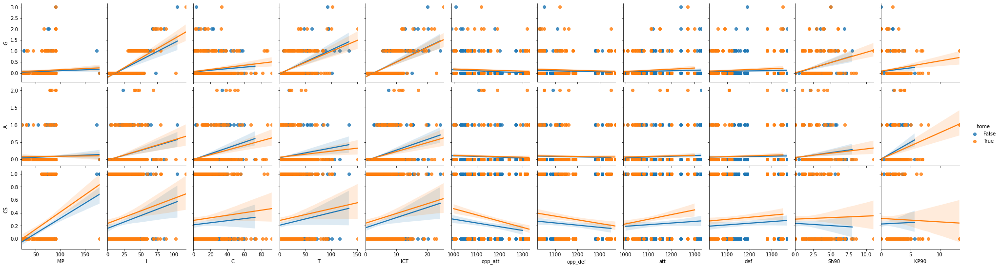

In [59]:
sns.pairplot(data=eda_sig.sample(1000),
y_vars=['G','A','CS'],
x_vars=['MP','I','C','T','ICT','opp_att','opp_def','att','def','Sh90','KP90'],
hue='home',
kind='reg')

## Closer Look at Target Variable Dependencies

### Goals

From the pairplot we see that goals are most strongly related to the features of influence index, threat index, ICT index, and shots per 90.

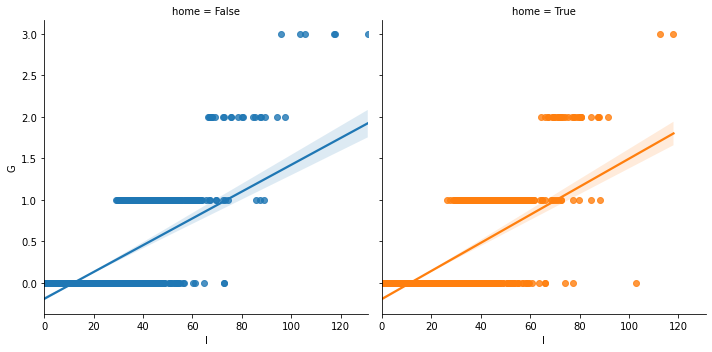

In [60]:
sns.lmplot(data=eda_sig,x='I',y='G',col='home',hue='home')

We observe a strong correlation between goals and influence index. The confidence interval is very narrow. The trend is very similar between home/away. Influence evaluates the degree to which that player has made an impact on a single match.

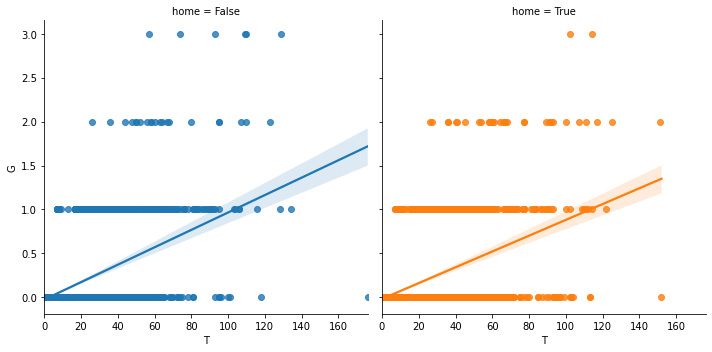

In [61]:
sns.lmplot(data=eda_sig,x='T',y='G',col='home',hue='home')

We observe a strong correlation between goals and threat index. The confidence interval is narrow. The trend is similar between home/away. Influence evaluates the degree to which that player has made an impact on a single match.

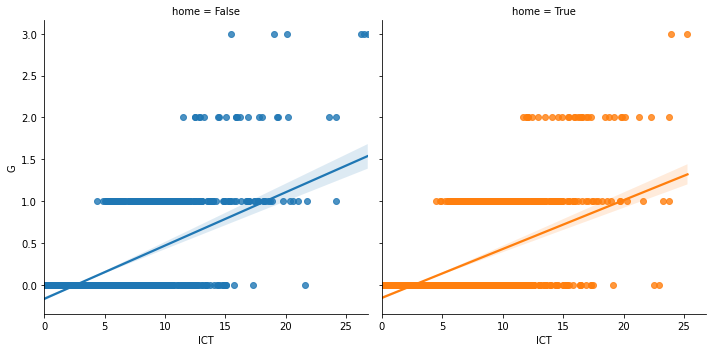

In [62]:
sns.lmplot(data=eda_sig,x='ICT',y='G',col='home',hue='home')

We observe a strong correlation between goals and ICT index. The confidence interval is very narrow. The trend is similar between home/away. ICT index is the combination of influence, creativity, and threat indices.

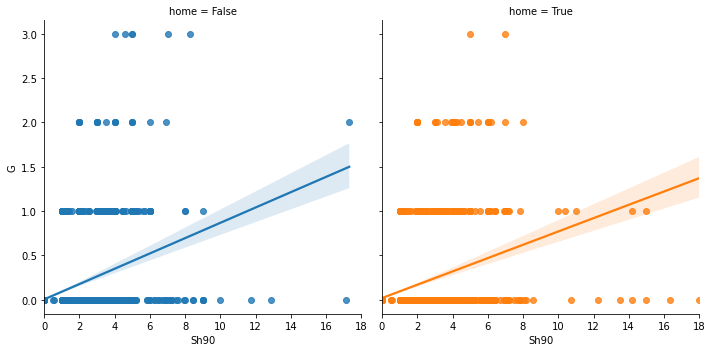

In [63]:
sns.lmplot(data=eda_sig,x='Sh90',y='G',col='home',hue='home')

We observe a strong correlation between goals and shots per 90 minutes. The confidence interval is somewhat narrow, widening at higher shots per 90 likely due to inefficient strikers and players who make shots with low gametime. The trend is similar between home/away.

### Assists

From the pairplot we see that assists are most strongly related to the features of influence index, creativity index, ICT index, and key passes per 90.

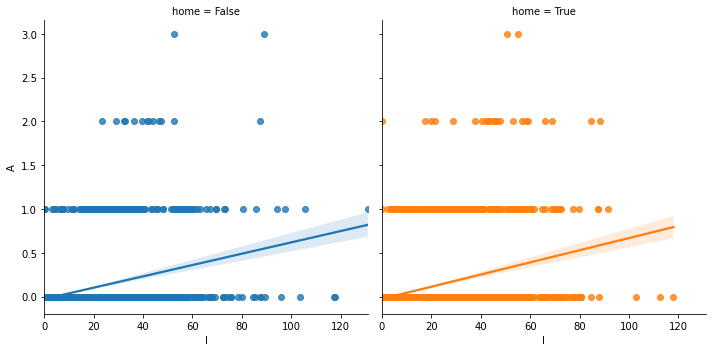

In [64]:
sns.lmplot(data=eda_sig,x='I',y='A',col='home',hue='home')

We observe a strong correlation between assists and influence index. The confidence interval is narrow. The trend is similar between home/away. 

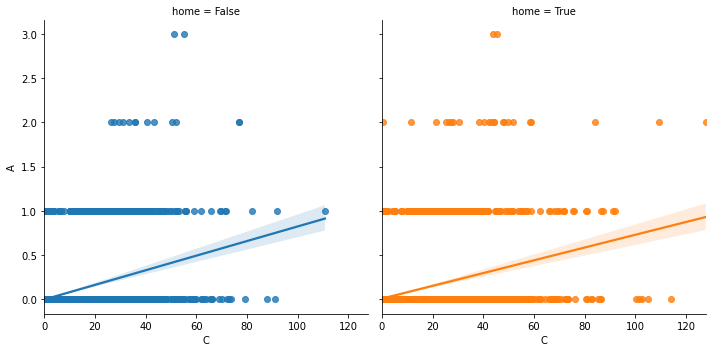

In [65]:
sns.lmplot(data=eda_sig,x='C',y='A',col='home',hue='home')

We observe a strong correlation between assists and creativity index. The confidence interval is narrow. The trend is similar between home/away. Creativity index assesses player performance in terms of producing goalscoring opportunities for other


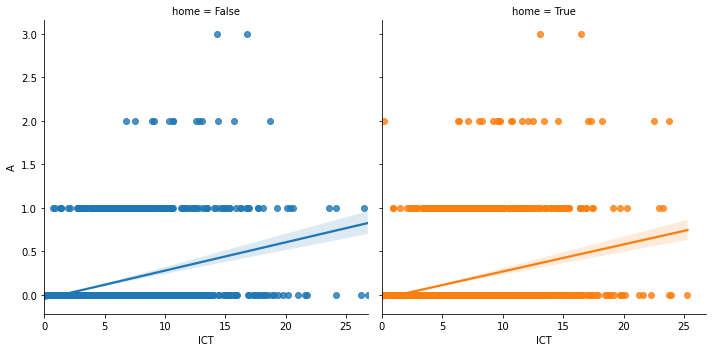

In [66]:
sns.lmplot(data=eda_sig,x='ICT',y='A',col='home',hue='home')

We observe a strong correlation between assists and ICT index. The confidence interval is very narrow. The trend is similar between home/away.

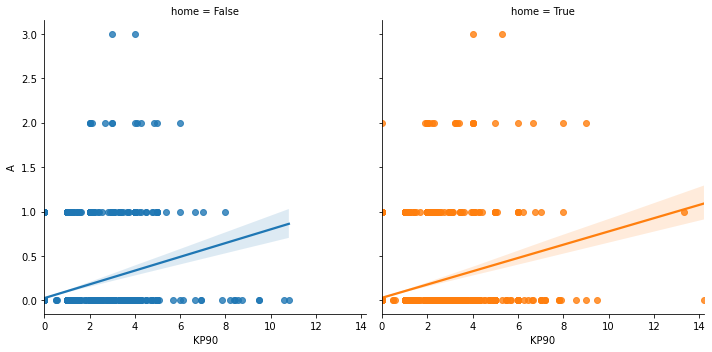

In [67]:
sns.lmplot(data=eda_sig,x='KP90',y='A',col='home',hue='home')

We observe a strong correlation between assists and key passes per 90 minutes. The confidence interval is somewhat narrow. The trend is similar between home/away.

### Clean Sheets

From the pairplot we see that clean sheets are most strongly related to minutes played. This will be further explored. There appears to be a significant disparity between home/away for this feature. FPL indexes are not considered for this feature because individual indexes do not always relate to an entire team's ability to get a clean sheet, this is observed by the wide confidence intervals in these plots. The positive correlations are likely due to better players being more likely to be on a better team, that attains a clean sheet more often. This is not a correlation with a causal relation. The same argument is made for individual stats of Sh90 and KP90. The two key team stats dictating clean sheet probability should be oppositions attack rating and team's defence rating. Opponents defence and teams attack are disregarded as they would have much less impact on clean sheet probability.

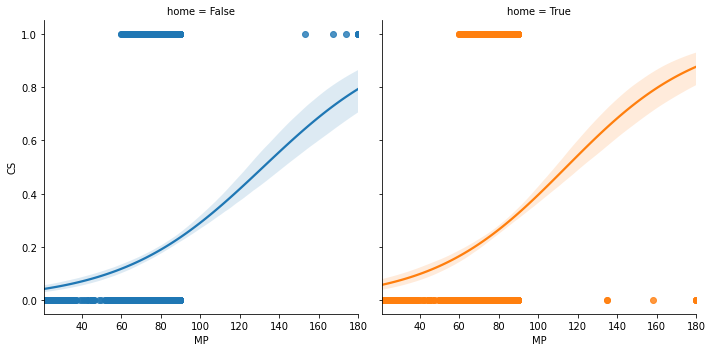

In [68]:
sns.lmplot(data=eda_sig,x='MP',y='CS',col='home',hue='home',logistic=True)

logistic option is used for this feature as it is a binary variable. The caveat for FPL clean sheets is that they are only awarded to players who play at least 60 minutes in the game, so the relationship may not be as strong as it seems. we consider players who play for over 60 minutes, and only one game (<=90).

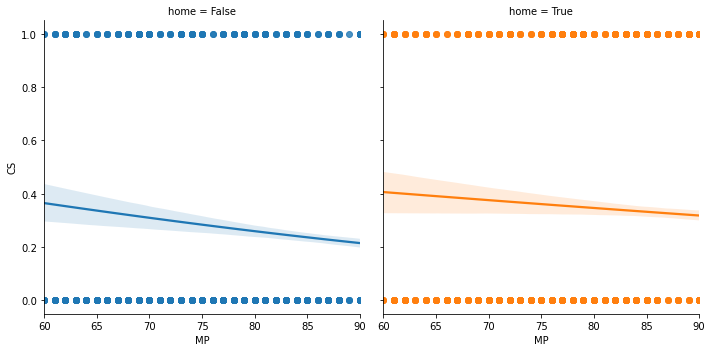

In [69]:
sns.lmplot(data=eda_sig[eda_sig['MP'].between(60,90,inclusive=True)],x='MP',y='CS',col='home',hue='home',logistic=True)

We observe that the relationship breaks down significantly. The slight negative correlation is due to the fact that as the game progresses, the opposition has more opportunities to score. This is also due to the fact that FPL CS's are given if a cleansheet was maintained while the player was on the field. We therefore disregard this relationship, but its obvious that players who play over 60 minutes are ideal for CS points. The disparity between home and away is relevant however.

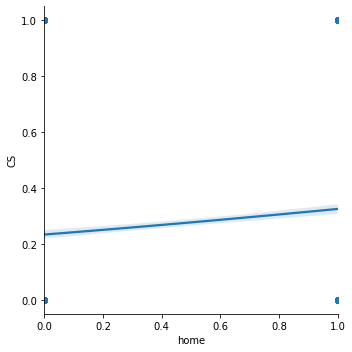

In [70]:
sns.lmplot(data=eda_sig[eda_sig['MP']>60],x='home',y='CS',logistic=True)

We observe that a clean sheet is somewhat more probable if a team is at home.

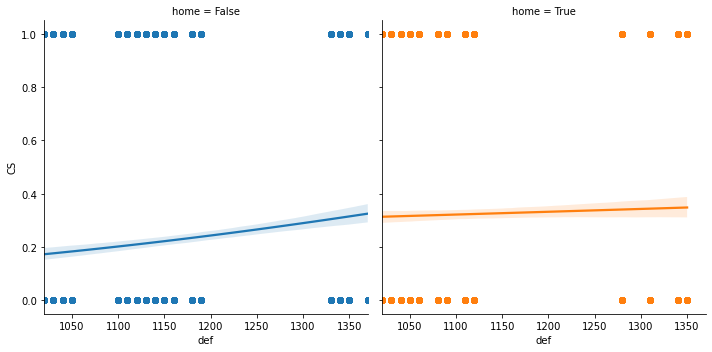

In [71]:
sns.lmplot(data=eda_sig[eda_sig['MP']>60],x='def',y='CS',col='home',hue='home',logistic=True)

This plot shows a relatively week relationship between defence rating and clean sheets. This is evidence that the FPL rating scheme is poor. The scheme is especially poor for home defence ratings. We expect this feature to be a principal variable affecting clean sheets, if the rating scheme was effective.

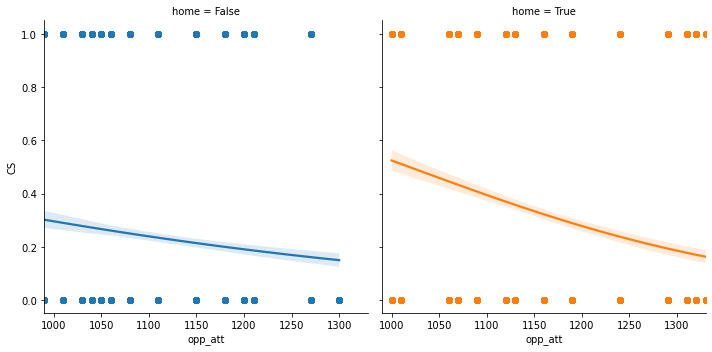

In [72]:
sns.lmplot(data=eda_sig[eda_sig['MP']>60],x='opp_att',y='CS',col='home',hue='home',logistic=True)

Another expected chief variable is opposition attack strength. Again the rating scheme seems poor, although not as bad as defence rating. The home opposition attack rating (i.e. a teams away attack rating) appears to be rather accurate. 

# ---------------------

In [73]:
eda_sig.to_csv('eda_sig.csv')

In [74]:
eda_all.to_csv('eda_all.csv')

dataframes saved for machine learning.